# Asthma and Pollution Methodology
Ainsley Atherton, Nikki La, Jordan Ledbetter, Palaniappan Vijay Sithambaram


In [41]:
#Packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

#Hello World. Testing!


## Datasets
- The CDC National Environmental Public Health Tracking Network is a collection of data
comprising of census data, the Behavioral Risk Factor Surveillance System (BRFSS), and other
epidemiological surveys. Querying asthma data by county and year for emergency room visits, hospitalizations, and prevalence. 
    - Emergency room data includes: StateFIPS, State, CountyFIPS, County, Year, Value
    - Hospitalizations data includes: StateFIPS, State, CountyFIPS, County, Year, Value
    - Prevalence data includes: StateFIPS, State, CountyFIPS, County, Year, Value, Data Comment, 95% Confidence Interval, Confidence Interval Low, Confidence Interval High
- Environmental Protection Agency (EPA) data is utilized for this project, specifically, annual Air Quality Index (AQI) data by county spanning the years 2000 to 2021. 
    - The CSV file encompasses the following variables: State, County, Year, Days with AQI, Good Days, Moderate Days, Unhealthy for Sensitive Groups Days, Unhealthy Days, Very Unhealthy Days, Hazardous Days, Max AQI, 90th Percentile AQI, Median AQI, Days CO, Days NO2, Days Ozone, Days PM2.5, Days PM10.


- Note: It's important to acknowledge that not all counties may report data; however, the analysis captures trends across urban and highly populated areas.

In [42]:
#Read in the data
#Asthma
folder_path = 'CDC_Asthma_Data'
asthma_prev = pd.read_csv(folder_path + '/Adult_Asthma_prev2018-2021/data_180748.csv')
asthma_hosp = pd.read_csv(folder_path + '/Asthma_Hospitalizations2000-2021/data_181454.csv')
asthma_er = pd.read_csv(folder_path + '/ER_visits_Asthma2000-2021/data_181211.csv')


In [43]:
#EPA Data 2000 - 2021
AQI_folder_path = 'CDC_Asthma_Data/AQI_data'
AQI2000 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2000.csv')
AQI2001 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2001.csv')
AQI2002 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2002.csv')
AQI2003 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2003.csv')
AQI2004 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2004.csv')
AQI2005 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2005.csv')
AQI2006 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2006.csv')
AQI2007 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2007.csv')
AQI2008 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2008.csv')
AQI2009 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2009.csv')
AQI2010 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2010.csv')
AQI2011 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2011.csv')
AQI2012 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2012.csv')
AQI2013 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2013.csv')
AQI2014 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2014.csv')
AQI2015 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2015.csv')
AQI2016 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2016.csv')
AQI2017 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2017.csv')
AQI2018 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2018.csv')
AQI2019 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2019.csv')
AQI2020 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2020.csv')
AQI2021 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2021.csv')

In [44]:
### Load shapefiles
# Counties
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'
county_gdf = gpd.read_file(url_county)

# States
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'
state_gdf = gpd.read_file(url_county)

# Exclude everthing outside the contiguous US
exclude_list = [15, 72, 2, 60, 66, 69, 78]
county_gdf = county_gdf.loc[~county_gdf['STATEFP'].astype(int).isin(exclude_list)]
state_gdf = state_gdf.loc[~state_gdf['STATEFP'].astype(int).isin(exclude_list)]

# Convert to 5070
county_gdf = county_gdf.to_crs(5070) 
state_gdf = state_gdf.to_crs(5070)

# Create a FIPS code
county_gdf['FIPS'] = county_gdf.STATEFP + county_gdf.COUNTYFP

## Data Pre-Processing

### Asthma Prevalence

In [45]:
asthma_prev.rename(columns = {'Value':'Prevalence %'}, inplace = True) 

#Remove null columns and unneded columns
asthma_prev = asthma_prev.drop(['Data Comment', 'Unnamed: 10', '95% Confidence Interval', 'Confidence Interval Low', 'Confidence Interval High'], axis=1)

## Merge asthma prevalence data with geospatial data
# Convert county FIPS code columns to strings
asthma_prev['CountyFIPS'] = asthma_prev['CountyFIPS'].astype(str)

# Add leading zeros to FIPS code where needed
asthma_prev['CountyFIPS'] = asthma_prev['CountyFIPS'].apply(lambda x: x.zfill(5))

# Groupy values by FIPS 
#grouped_hosp = asthma_hosp.groupby('CountyFIPS')['Hospitalizations (rate per 10,000)'].sum().reset_index()

prev18 = asthma_prev[asthma_prev['Year'] == 2018]
prev19 = asthma_prev[asthma_prev['Year'] == 2019]
prev20 = asthma_prev[asthma_prev['Year'] == 2020]
prev21 = asthma_prev[asthma_prev['Year'] == 2021]

# Merge the datasets on their FIPS code

merged_prev18 = county_gdf.merge(prev18, left_on='FIPS', right_on='CountyFIPS', how='left')
merged_prev19 = county_gdf.merge(prev19, left_on='FIPS', right_on='CountyFIPS', how='left')
merged_prev20 = county_gdf.merge(prev20, left_on='FIPS', right_on='CountyFIPS', how='left')
merged_prev21 = county_gdf.merge(prev21, left_on='FIPS', right_on='CountyFIPS', how='left')

### Hospitalizations due to Asthma
- Age adjusted rate of hospitalization for asthma per 10,000

In [46]:
# Rename Value column
asthma_hosp.rename(columns = {'Value':'Hospitalizations (rate per 10,000)'}, inplace = True) 

# Remove all-null columns
asthma_hosp = asthma_hosp.drop(columns = 'Unnamed: 7')

# Calculate percentage of suppressed data
is_suppressed = asthma_hosp[asthma_hosp['Hospitalizations (rate per 10,000)'] == 'Suppressed']
#print('Percentage of Suppressed Data:', (len(is_suppressed) / len(asthma_hosp)) * 100)

# Calculate percentage of unstability
is_unstable = asthma_hosp[asthma_hosp['Data Comment'] == 'Unstable']
#print('Percentage of Unstability:', (len(is_unstable) / len(asthma_hosp)) * 100)

# Asthma Hospitalizations: 2000-2021
asthma_hosp['Hospitalizations (rate per 10,000)'] = asthma_hosp['Hospitalizations (rate per 10,000)'].replace('Suppressed', np.nan) #convert 'Supressed' values to NaN
asthma_hosp['Hospitalizations (rate per 10,000)'] = pd.to_numeric(asthma_hosp['Hospitalizations (rate per 10,000)']) #convert value to numeric column

# Fix columns for successful merge
asthma_hosp = asthma_hosp.drop(columns='Data Comment')
asthma_hosp['CountyFIPS'] = asthma_hosp['CountyFIPS'].astype(int)
asthma_hosp

,StateFIPS,State,CountyFIPS,County,Year,"Hospitalizations (rate per 10,000)"
0,4,Arizona,4001,Apache,2005,7.2
1,4,Arizona,4001,Apache,2006,4.8
2,4,Arizona,4001,Apache,2007,3.6
3,4,Arizona,4001,Apache,2008,5.1
4,4,Arizona,4001,Apache,2009,5.6
...,...,...,...,...,...,...
33473,55,Wisconsin,55141,Wood,2017,3.7
33474,55,Wisconsin,55141,Wood,2018,2.6
33475,55,Wisconsin,55141,Wood,2019,2.7
33476,55,Wisconsin,55141,Wood,2020,NaN


### ER visits due to Asthma

In [47]:
asthma_er.rename(columns = {'Value':'ER visits for Asthma (rate per 10,000)'}, inplace = True) 
#asthma_er.info()

asthma_er = asthma_er.drop(['Unnamed: 7', 'Data Comment'], axis=1)

# Calculate percentage of suppressed data
er_suppressed = asthma_er[asthma_er['ER visits for Asthma (rate per 10,000)'] == 'Suppressed']
#print('Percentage of Suppressed Data:', (len(er_suppressed) / len(asthma_er)) * 100)

# Asthma ER visits: 2000-2021
asthma_er['ER visits for Asthma (rate per 10,000)'] = asthma_er['ER visits for Asthma (rate per 10,000)'].replace('Suppressed', np.nan) #convert 'Supressed' values to NaN
asthma_er['ER visits for Asthma (rate per 10,000)'] = pd.to_numeric(asthma_er['ER visits for Asthma (rate per 10,000)']) #convert value to numeric column
#asthma_er['ER visits for Asthma (rate per 10,000)'].describe()

county_gdf.rename(columns = {'GEOID':'CountyFIPS'}, inplace = True) 

## Asthma Data Highlights

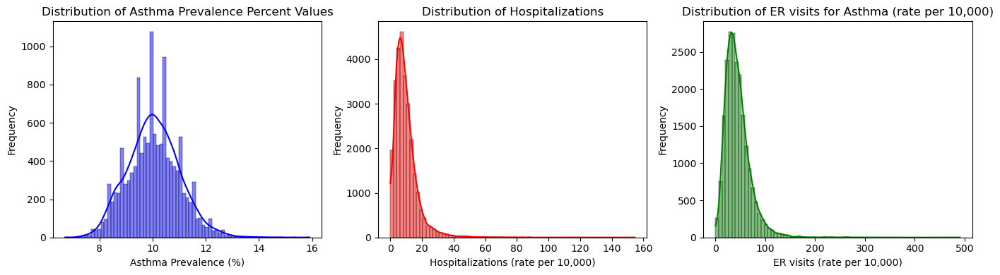

In [48]:
# Create a figure and three subplots
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

# Plot the histograms
sns.histplot(ax=axs[0], data=asthma_prev, x='Prevalence %', bins=75, kde=True, color='blue', alpha=0.5)
axs[0].set_title('Distribution of Asthma Prevalence Percent Values')
axs[0].set_xlabel('Asthma Prevalence (%)')
axs[0].set_ylabel('Frequency')

sns.histplot(ax=axs[1], data=asthma_hosp, x='Hospitalizations (rate per 10,000)', bins=75, kde=True, color='red')
axs[1].set_title('Distribution of Hospitalizations')
axs[1].set_xlabel('Hospitalizations (rate per 10,000)')
axs[1].set_ylabel('Frequency')

sns.histplot(ax=axs[2], data=asthma_er, x='ER visits for Asthma (rate per 10,000)', bins=75, kde=True, color='green')
axs[2].set_title('Distribution of ER visits for Asthma (rate per 10,000)')
axs[2].set_xlabel('ER visits (rate per 10,000)')
axs[2].set_ylabel('Frequency')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the figure
plt.show()



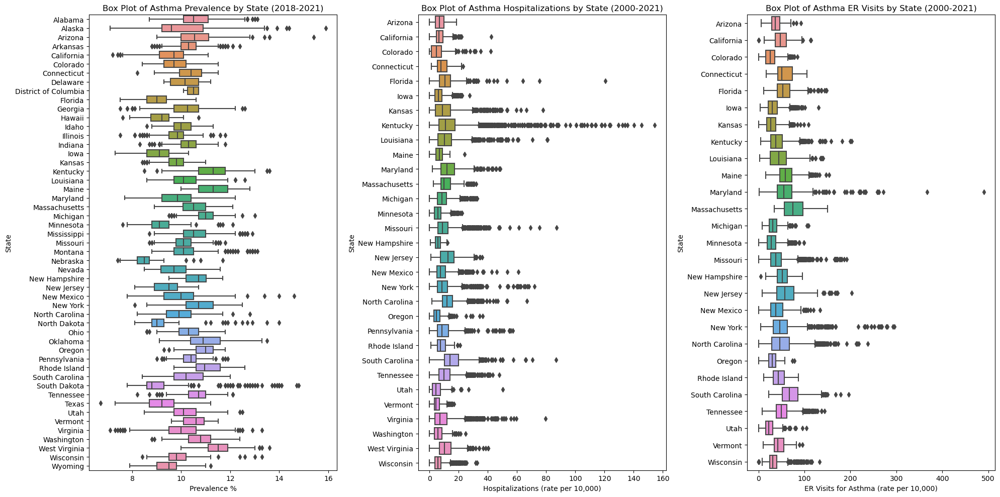

In [49]:
# Box Plot of Asthma ER Visits by State
fig, axs = plt.subplots(1, 3, figsize=(20, 10))

sns.boxplot(ax=axs[0], data=asthma_prev[(asthma_prev['Year'] >= 2018) & (asthma_prev['Year'] <= 2021)],
            x='Prevalence %', y='State', orient='h')
axs[0].set_title('Box Plot of Asthma Prevalence by State (2018-2021)')
axs[0].set_xlabel('Prevalence %')
axs[0].set_ylabel('State')

sns.boxplot(ax=axs[1], data=asthma_hosp[(asthma_hosp['Year'] >= 2000) & (asthma_hosp['Year'] <= 2021)],
            x='Hospitalizations (rate per 10,000)', y='State', orient='h')
axs[1].set_title('Box Plot of Asthma Hospitalizations by State (2000-2021)')
axs[1].set_xlabel('Hospitalizations (rate per 10,000)')
axs[1].set_ylabel('State')

sns.boxplot(ax=axs[2], data=asthma_er[(asthma_er['Year'] >= 2000) & (asthma_er['Year'] <= 2021)],
            x='ER visits for Asthma (rate per 10,000)', y='State', orient='h')
axs[2].set_title('Box Plot of Asthma ER Visits by State (2000-2021)')
axs[2].set_xlabel('ER Visits for Asthma (rate per 10,000)')
axs[2].set_ylabel('State')

plt.tight_layout()
plt.show()
#axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)



### Air Quality

In [50]:
# Merge AQI data from 2000 - 2019
all_aqi_data = pd.concat([AQI2000, AQI2001, AQI2002, AQI2003, AQI2004, AQI2005, AQI2006, AQI2007, AQI2008, AQI2009, AQI2010,
                          AQI2011, AQI2012, AQI2013, AQI2014, AQI2015, AQI2016, AQI2017, AQI2018, AQI2019, AQI2020, AQI2021], ignore_index=True)

In [51]:
# Find NaN values
nan_values = all_aqi_data.isna().sum()
#print(nan_values) # 0 NaN values
#print(all_aqi_data.shape)

all_aqi_data
all_aqi_data = all_aqi_data.sort_values(by = ['County', 'Year'], ascending = True)
#all_aqi_data

#columns_to_keep = ['State','FIPS', 'County', 'geometry']
columns_to_keep = ['STATE_NAME', "FIPS", 'NAME', 'geometry']
gdf_extra = county_gdf[columns_to_keep]

gdf_extra.rename(columns = {'STATE_NAME':'State', 'NAME':'County'}, inplace = True)

#merging with geospatial data
all_aqi_data = all_aqi_data.merge(gdf_extra, left_on = ['State', 'County'], right_on = ['State', 'County'], how = 'left')
#all_aqi_data.head(3)

/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/729488311.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf_extra.rename(columns = {'STATE_NAME':'State', 'NAME':'County'}, inplace = True)


In [52]:
geo_aqi_list = []

# Loop through years from 2000 to 2019
for year in range(2000, 2022):
    # Create a mask for the current year
    year_mask = (all_aqi_data['Year'] == year)
    
    # Filter data for the current year
    aqi_year = all_aqi_data[year_mask]
    
    # Merge AQI data with the county
    geo_aqi_year = county_gdf.merge(aqi_year)
    
    geo_aqi_list.append(geo_aqi_year)

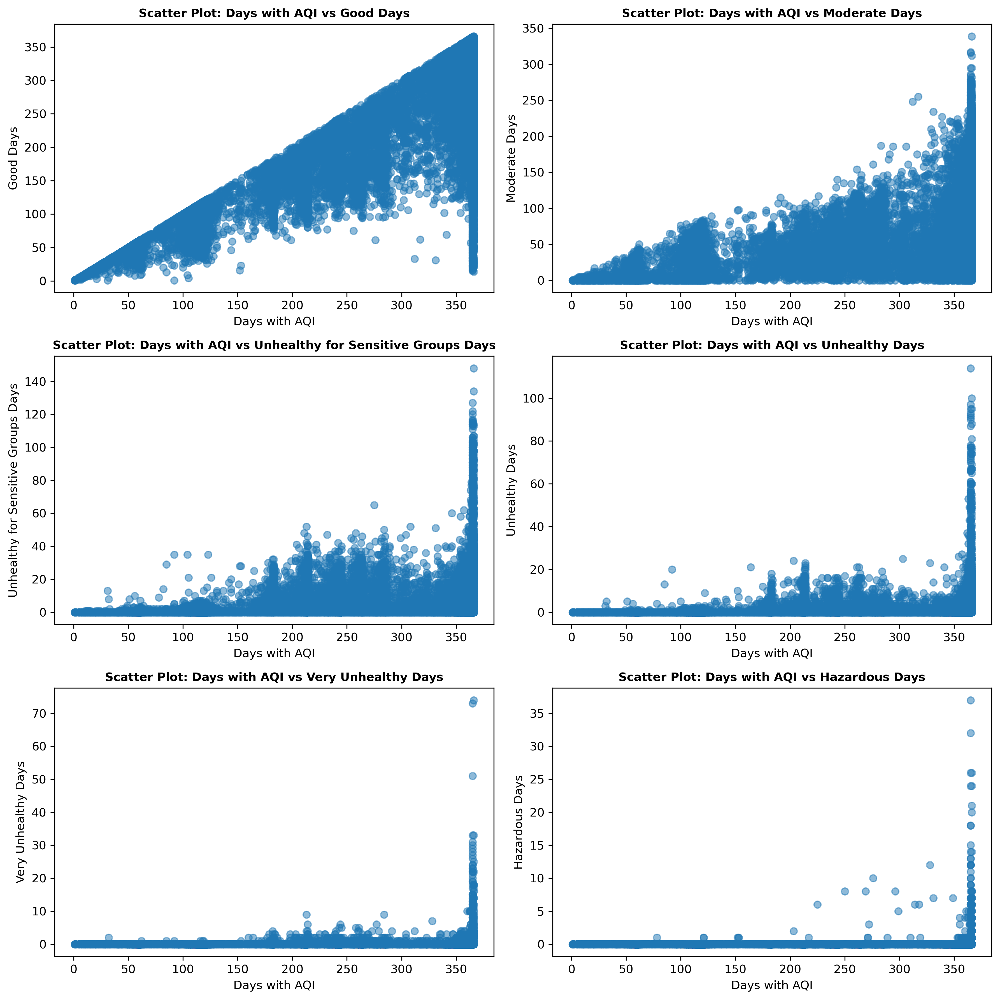

In [53]:
categories = ['Good Days', 'Moderate Days', 'Unhealthy for Sensitive Groups Days', 'Unhealthy Days', 'Very Unhealthy Days', 'Hazardous Days']

fig, axes = plt.subplots(3, 2, figsize=(12, 12), dpi=300)

for i, category in enumerate(categories):
    row, col = divmod(i, 2)
    axes[row, col].scatter(all_aqi_data['Days with AQI'], all_aqi_data[category], alpha=0.5)
    axes[row, col].set_title(f'Scatter Plot: Days with AQI vs {category}', fontsize=10, fontweight='bold')
    axes[row, col].set_xlabel('Days with AQI')
    axes[row, col].set_ylabel(category)

plt.tight_layout()
plt.show()

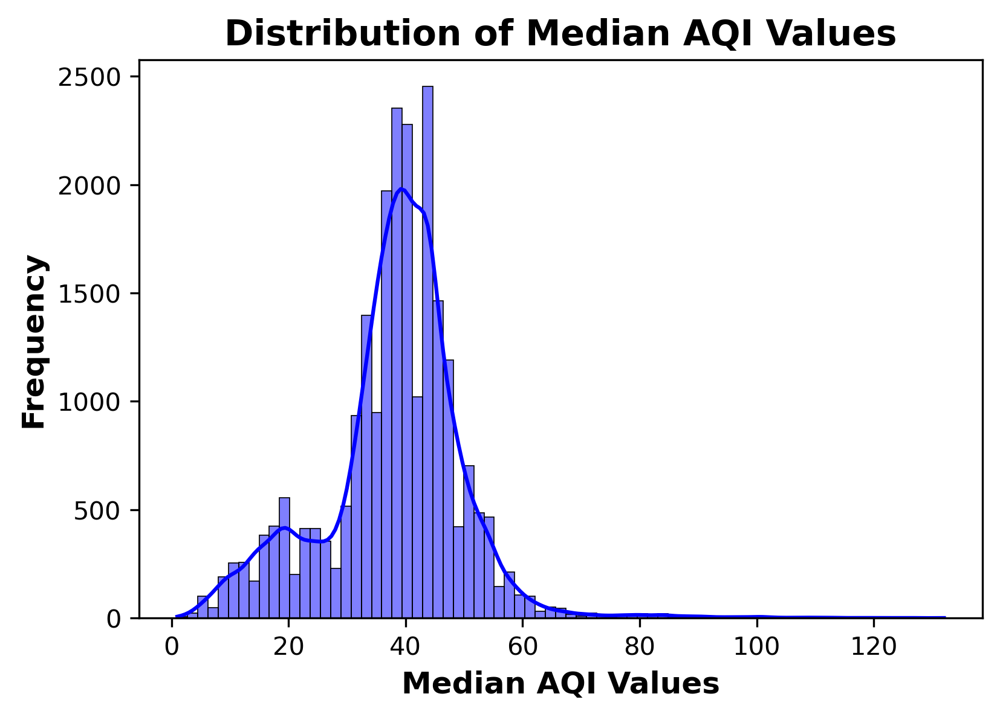

In [54]:
plt.figure(figsize=(6, 4), dpi=300)
sns.histplot(data=all_aqi_data, x='Median AQI', bins=75, kde=True, color='blue')
plt.title('Distribution of Median AQI Values', fontsize=14, fontweight='bold')
plt.xlabel('Median AQI Values', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.show()

## Asthma Prevalence and Air Quality

In [55]:
aqi_prev = pd.merge(all_aqi_data, asthma_prev, on = ['State', 'County', 'Year'], how = 'left')

In [56]:
aqi_prev18 = aqi_prev[aqi_prev['Year'] == 2018]
geo_aqiprev18 = county_gdf.merge(aqi_prev18)

aqi_prev19 = aqi_prev[aqi_prev['Year'] == 2019]
geo_aqiprev19 = county_gdf.merge(aqi_prev19)

aqi_prev20 = aqi_prev[aqi_prev['Year'] == 2020]
geo_aqiprev20 = county_gdf.merge(aqi_prev20)

aqi_prev21 = aqi_prev[aqi_prev['Year'] == 2021]
geo_aqiprev21 = county_gdf.merge(aqi_prev21)

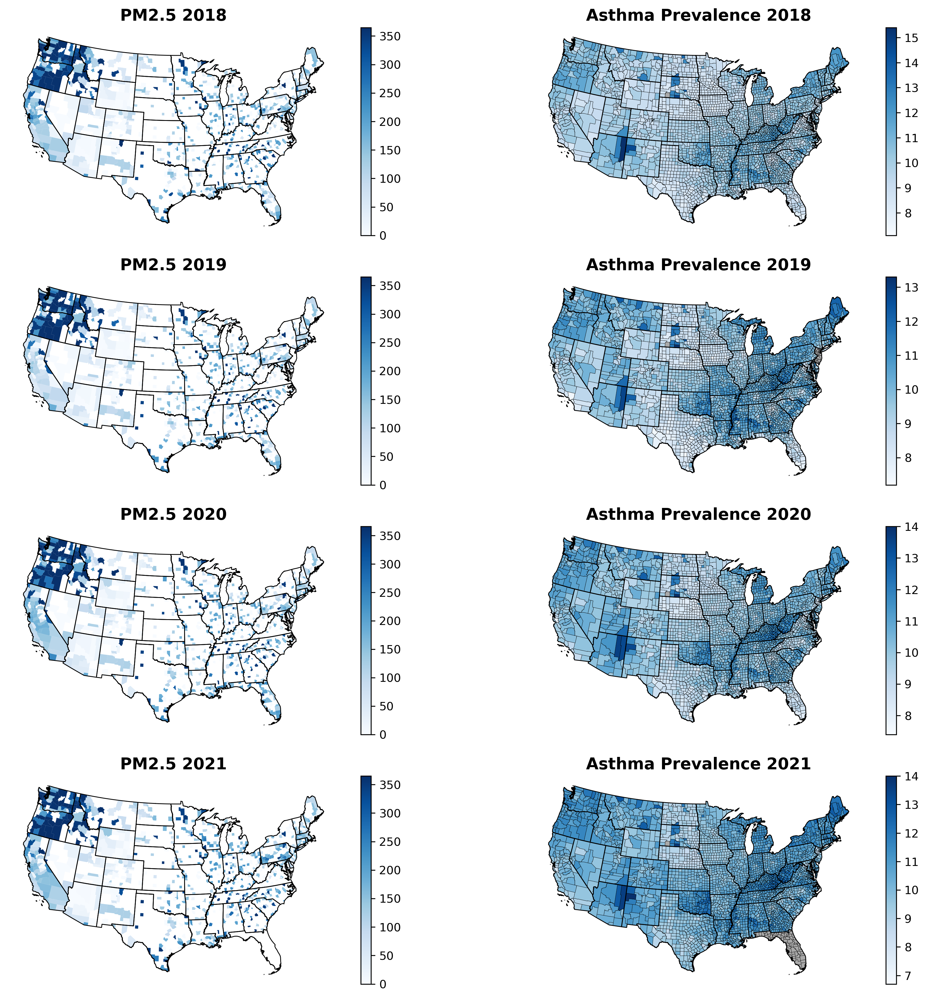

In [57]:
#aqi_prev18.plot(column = 'Daily Mean PM2.5 Concentration', cmap = 'viridis', legend = True)
#state_gdf.plot()

fig, axes = plt.subplots(4, 2, figsize=(15, 15), dpi=300)

axes = axes.flatten()

# 2018
geo_aqiprev18.plot(column='Days PM2.5', ax = axes[0], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[0], facecolor='none', edgecolor='black', linewidth=0.7)
# 2019
geo_aqiprev19.plot(column='Days PM2.5', ax = axes[2], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[2], facecolor='none', edgecolor='black', linewidth=0.7)
# 2020
geo_aqiprev20.plot(column='Days PM2.5', ax = axes[4], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[4], facecolor='none', edgecolor='black', linewidth=0.7)
# 2021
geo_aqiprev21.plot(column='Days PM2.5', ax = axes[6], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[6], facecolor='none', edgecolor='black', linewidth=0.7)

# 2018
merged_prev18.plot(column='Prevalence %', ax = axes[1], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[1], facecolor='none', edgecolor='black', linewidth=0.7)
# 2019
merged_prev19.plot(column='Prevalence %', ax=axes[3], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[3], facecolor='none', edgecolor='black', linewidth=0.7)
# 2020
merged_prev20.plot(column='Prevalence %', ax=axes[5], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[5], facecolor='none', edgecolor='black', linewidth=0.7)
# 2021
merged_prev21.plot(column='Prevalence %', ax=axes[7], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[7], facecolor='none', edgecolor='black', linewidth=0.7)

axs = [0,1,2,3,4,5,6,7]
for i in axs:
    axes[i].set_axis_off()

axes[0].set_title('PM2.5 2018', fontsize=14, fontweight='bold')
axes[1].set_title('Asthma Prevalence 2018', fontsize=14, fontweight='bold')
axes[2].set_title('PM2.5 2019', fontsize=14, fontweight='bold')
axes[3].set_title('Asthma Prevalence 2019', fontsize=14, fontweight='bold')
axes[4].set_title('PM2.5 2020', fontsize=14, fontweight='bold')
axes[5].set_title('Asthma Prevalence 2020', fontsize=14, fontweight='bold')
axes[6].set_title('PM2.5 2021', fontsize=14, fontweight='bold')
axes[7].set_title('Asthma Prevalence 2021', fontsize=14, fontweight='bold')

plt.show()

In [58]:
#aqi_prev

/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/311353232.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(aqi_prev_adjusted.corr(), annot=True, cmap='coolwarm')


<Axes: >

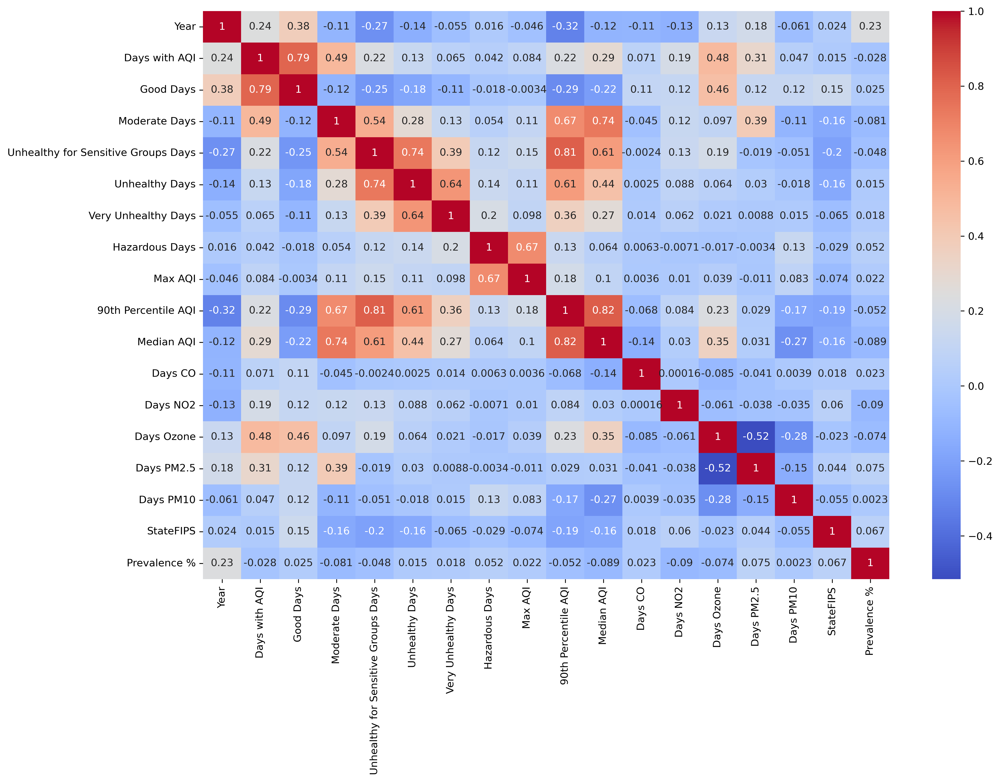

In [59]:
aqi_prev_adjusted = aqi_prev.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_prev_adjusted.corr(), annot=True, cmap='coolwarm')

## Asthma Hospitalizations and Air Quality

In [60]:
aqi_hosp = pd.merge(all_aqi_data, asthma_hosp, on = ['State', 'County', 'Year'], how = 'left')

In [61]:
measures = ['Good Days',
       'Moderate Days', 'Unhealthy for Sensitive Groups Days',
       'Unhealthy Days', 'Very Unhealthy Days', 'Hazardous Days', 'Max AQI', 'Median AQI', 'Days CO', 'Days NO2',
       'Days Ozone', 'Days PM2.5', 'Days PM10', 'Year', 'Hospitalizations (rate per 10,000)']

In [62]:
aqi_hosp_abbevilleSC = aqi_hosp[aqi_hosp['County'] == 'Abbeville']
aqi_hosp_abbevilleSC = aqi_hosp_abbevilleSC[measures]


/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/2416114902.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(aqi_hosp_adjusted.corr(), annot=True, cmap='coolwarm')


<Axes: >

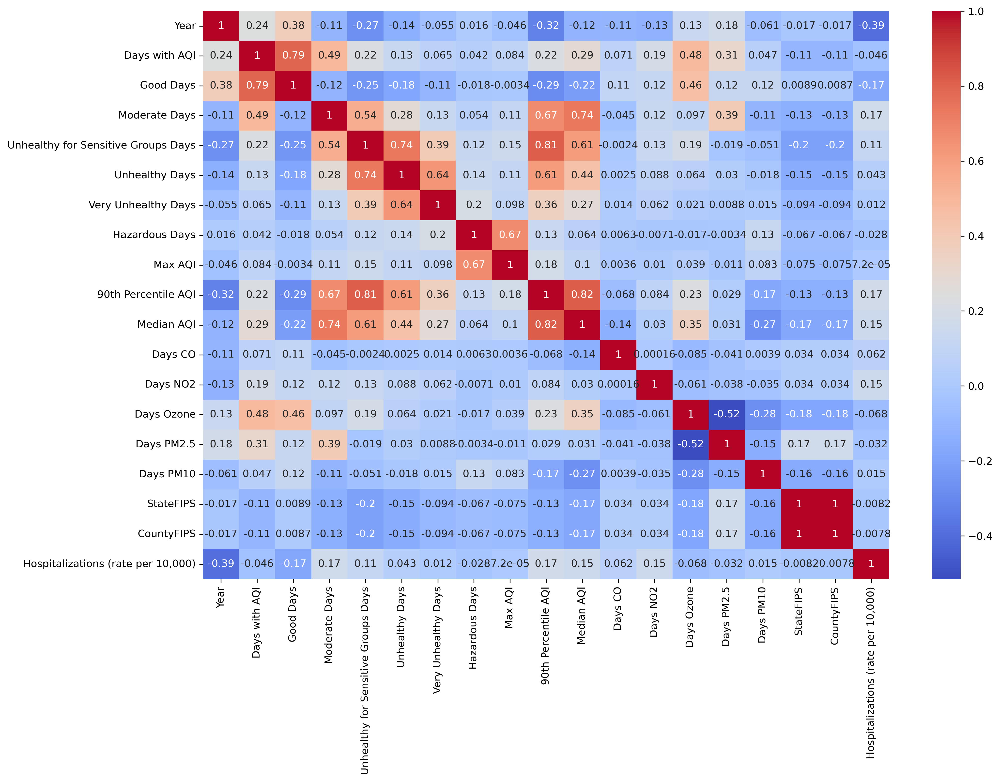

In [63]:
aqi_hosp_adjusted = aqi_hosp.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_hosp_adjusted.corr(), annot=True, cmap='coolwarm')

In [64]:
aqi_hosp.head(3)

,State,County,Year,Days with AQI,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,...,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10,FIPS,geometry,StateFIPS,CountyFIPS,"Hospitalizations (rate per 10,000)"
0,South Carolina,Abbeville,2000,219,98,89,29,3,0,0,...,0,0,219,0,0,45001,"POLYGON ((1208444.711 1323075.671, 1213152.084...",45.0,45001.0,11.3
1,South Carolina,Abbeville,2001,234,124,79,30,1,0,0,...,0,0,234,0,0,45001,"POLYGON ((1208444.711 1323075.671, 1213152.084...",45.0,45001.0,10.2
2,South Carolina,Abbeville,2002,235,127,71,29,8,0,0,...,0,0,235,0,0,45001,"POLYGON ((1208444.711 1323075.671, 1213152.084...",45.0,45001.0,14.8


In [65]:
counties = aqi_hosp['County'].unique()

for county in counties:
    
    # Filter the data for the current county
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    
    # Exclude non-numeric columns
    numeric_columns = county_data.select_dtypes(include='number')
    
    corr_matrix = numeric_columns.corr()
    
    # Tail of the correlation matrix
    tail_corr_values = corr_matrix.iloc[-1]
    
    print(f"Correlation values for {county} County:")
    print(tail_corr_values)
    print()

Correlation values for Abbeville County:
Year                                  -0.563650
Days with AQI                          0.400663
Good Days                             -0.048567
Moderate Days                          0.300886
Unhealthy for Sensitive Groups Days    0.442367
Unhealthy Days                         0.460278
Very Unhealthy Days                         NaN
Hazardous Days                              NaN
Max AQI                                0.350918
90th Percentile AQI                    0.523335
Median AQI                             0.332921
Days CO                                     NaN
Days NO2                                    NaN
Days Ozone                             0.400663
Days PM2.5                                  NaN
Days PM10                                   NaN
StateFIPS                                   NaN
CountyFIPS                                  NaN
Hospitalizations (rate per 10,000)     1.000000
Name: Hospitalizations (rate per 10,000), dtype

In [66]:
counties = aqi_hosp['County'].unique()

# Dict with correlation values
correlation_values = {}
for county in counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    
    # Correlation values for pollutants
    relevant_corr_values = corr_matrix.loc[['Days CO', 'Days NO2', 'Days Ozone', 'Days PM2.5', 'Days PM10']]
    
    avg_corr = relevant_corr_values.mean().mean()
    
    correlation_values[county] = avg_corr

# Sort counties based on the average correlation with pollutants
sorted_counties = sorted(correlation_values, key=correlation_values.get, reverse=True)

for county in sorted_counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    tail_corr_values = corr_matrix.iloc[-1]
    
    print(f"Correlation values for {county} County:")
    print(tail_corr_values)
    print()

Correlation values for Alpena County:
Year                                  -1.0
Days with AQI                          1.0
Good Days                              1.0
Moderate Days                          1.0
Unhealthy for Sensitive Groups Days    1.0
Unhealthy Days                         NaN
Very Unhealthy Days                    NaN
Hazardous Days                         NaN
Max AQI                                1.0
90th Percentile AQI                    1.0
Median AQI                            -1.0
Days CO                                NaN
Days NO2                               NaN
Days Ozone                             NaN
Days PM2.5                             1.0
Days PM10                              NaN
StateFIPS                              NaN
CountyFIPS                             NaN
Hospitalizations (rate per 10,000)     1.0
Name: Hospitalizations (rate per 10,000), dtype: float64

Correlation values for Barbour County:
Year                                  NaN
Days w

In [67]:
## Note: This is with NaN values removed for the pollutants


# Dict with correlation values
correlation_values = {}
for county in counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    
    # Correlation values for pollutants
    relevant_corr_values = corr_matrix.loc[['Days CO', 'Days NO2', 'Days Ozone', 'Days PM2.5', 'Days PM10']]
    
    # Exclude counties with all NaN values for the specified columns
    if not relevant_corr_values.isnull().all().any():
        avg_corr = relevant_corr_values.mean().mean()
        
        correlation_values[county] = avg_corr

# Sort counties based on the average correlation with pollutants
sorted_counties = sorted(correlation_values, key=correlation_values.get, reverse=True)

for county in sorted_counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    tail_corr_values = corr_matrix.iloc[-1]
    
    print(f"Correlation values for {county} County:")
    print(tail_corr_values)
    print()

Correlation values for Jackson County:
Year                                  -0.428444
Days with AQI                          0.359284
Good Days                              0.000079
Moderate Days                          0.708113
Unhealthy for Sensitive Groups Days    0.128348
Unhealthy Days                        -0.199151
Very Unhealthy Days                   -0.235855
Hazardous Days                        -0.141590
Max AQI                                0.001332
90th Percentile AQI                    0.403581
Median AQI                             0.601133
Days CO                                0.055724
Days NO2                               0.662789
Days Ozone                            -0.346061
Days PM2.5                             0.435953
Days PM10                              0.189569
StateFIPS                              0.253138
CountyFIPS                             0.254988
Hospitalizations (rate per 10,000)     1.000000
Name: Hospitalizations (rate per 10,000), dtype: 

In [68]:
"""import seaborn as sns
import matplotlib.pyplot as plt

# Get the first 10 counties
counties = aqi_hosp['County'].unique()[:10]

# Iterate over each county
for county in counties:
    # Filter the data for the current county
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    # Drop unnecessary columns
    #county_data_adjusted = county_data.drop(columns=['geometry', 'State', 'County'])
    
    # Create a heatmap for the current county
    fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
    sns.heatmap(numeric_columns.corr(), annot=True, cmap='coolwarm')
    plt.title(f'Correlation Heatmap for {county} County')
    plt.show()"""

"""aqi_hosp_adjusted = aqi_hosp.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_hosp_adjusted.corr(), annot=True, cmap='coolwarm')"""


"aqi_hosp_adjusted = aqi_hosp.drop(columns=['geometry', 'State', 'County'])\nfig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)\nsns.heatmap(aqi_hosp_adjusted.corr(), annot=True, cmap='coolwarm')"

In [69]:
#correlation by variable for all counties
aqi_hosp.corr().tail(1)

/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/2210342117.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  aqi_hosp.corr().tail(1)


,Year,Days with AQI,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,Max AQI,90th Percentile AQI,Median AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10,StateFIPS,CountyFIPS,"Hospitalizations (rate per 10,000)"
"Hospitalizations (rate per 10,000)",-0.392238,-0.045975,-0.173514,0.168859,0.113351,0.04337,0.011988,-0.028465,0.000072,0.173096,0.14928,0.061978,0.147816,-0.068377,-0.032325,0.015361,-0.008168,-0.007804,1.0


In [70]:
# Count the NaN values in the 'Days CO' column of the 'aqi_hosp' DataFrame
nan_count = aqi_hosp['Hospitalizations (rate per 10,000)'].isna().sum()
print(nan_count)

aqi_hosp_nonans = aqi_hosp['Hospitalizations (rate per 10,000)'].dropna


11156


## Asthma ER Visits and Air Quality

In [71]:
aqi_er = pd.merge(all_aqi_data, asthma_er, on = ['State', 'County', 'Year'], how = 'left')

In [72]:
aqi_er.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23542 entries, 0 to 23541
Data columns (total 23 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   State                                   23542 non-null  object  
 1   County                                  23542 non-null  object  
 2   Year                                    23542 non-null  int64   
 3   Days with AQI                           23542 non-null  int64   
 4   Good Days                               23542 non-null  int64   
 5   Moderate Days                           23542 non-null  int64   
 6   Unhealthy for Sensitive Groups Days     23542 non-null  int64   
 7   Unhealthy Days                          23542 non-null  int64   
 8   Very Unhealthy Days                     23542 non-null  int64   
 9   Hazardous Days                          23542 non-null  int64   
 10  Max AQI                                 23542 

/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/1860858237.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(aqi_er_adjusted.corr(), annot=True, cmap='coolwarm')


<Axes: >

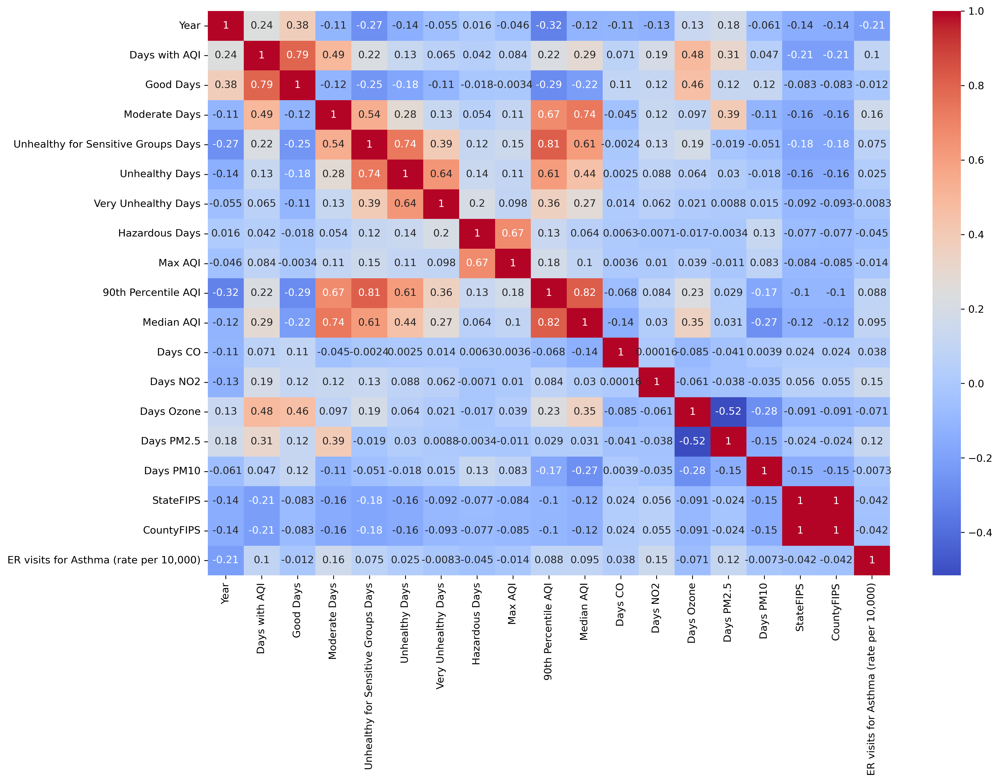

In [73]:
aqi_er_adjusted= aqi_er.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_er_adjusted.corr(), annot=True, cmap='coolwarm')

# Correlation Dataframes

In [74]:
hosp_aqi_corr = pd.DataFrame()

# Iterate over each county
for county in aqi_hosp['County'].unique():
    cname = county
    state = aqi_hosp[aqi_hosp['County'] == county]['State'].unique()[0]
    county_df = aqi_hosp[aqi_hosp['County'] == county].corr()
    county_df.insert(0, "County", cname, True)
    county_df.insert(1, "State", state, True)

    tail_end = county_df.tail(1)
    hosp_aqi_corr = pd.concat([hosp_aqi_corr, tail_end])

#hosp_aqi_corr = hosp_aqi_corr.drop(columns = ['Year']) #year corr values don't tell us anything
hosp_aqi_corr.tail(3)
#aqi_hosp.corr().tail(1)

/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/4216214617.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  county_df = aqi_hosp[aqi_hosp['County'] == county].corr()
/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/4216214617.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  county_df = aqi_hosp[aqi_hosp['County'] == county].corr()
/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/4216214617.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silen

,County,State,Year,Days with AQI,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,...,90th Percentile AQI,Median AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10,StateFIPS,CountyFIPS,"Hospitalizations (rate per 10,000)"
"Hospitalizations (rate per 10,000)",York,Maine,-0.760312,-0.017328,-0.371828,0.233779,0.511511,0.323230,0.121927,NaN,...,0.650321,0.245616,0.153934,0.211074,-0.224213,-0.072256,0.718246,0.504109,0.503456,1.0
"Hospitalizations (rate per 10,000)",Yukon-Koyukuk,Alaska,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Hospitalizations (rate per 10,000)",Yuma,Arizona,-0.918819,-0.433850,-0.423845,0.110447,0.525274,0.021979,-0.020911,-0.293888,...,0.464934,0.029200,NaN,0.426142,-0.862714,-0.795348,0.850216,NaN,NaN,1.0


In [75]:
prev_aqi_corr = pd.DataFrame()

# Iterate over each county
for county in aqi_prev['County'].unique():
    cname = county
    state = aqi_prev[aqi_prev['County'] == county]['State'].unique()[0]
    county_df = aqi_prev[aqi_prev['County'] == county].corr()
    county_df.insert(0, "County", cname, True)
    county_df.insert(1, "State", state, True)

    tail_end = county_df.tail(1)
    prev_aqi_corr = pd.concat([prev_aqi_corr, tail_end])

#hosp_aqi_corr = hosp_aqi_corr.drop(columns = ['Year']) #year corr values don't tell us anything
prev_aqi_corr.tail(3)
#aqi_hosp.corr().tail(1)

/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/2414985276.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  county_df = aqi_prev[aqi_prev['County'] == county].corr()
/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/2414985276.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  county_df = aqi_prev[aqi_prev['County'] == county].corr()
/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/2414985276.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silen

,County,State,Year,Days with AQI,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,Max AQI,90th Percentile AQI,Median AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10,StateFIPS,Prevalence %
Prevalence %,York,Maine,2.389638e-01,-0.718811,-0.727756,-0.360480,-0.260328,NaN,NaN,NaN,0.189107,-0.372045,-0.058651,NaN,0.036375,-0.145379,-0.581886,NaN,-0.794654,1.0
Prevalence %,Yukon-Koyukuk,Alaska,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Prevalence %,Yuma,Arizona,-1.621585e-15,0.471405,-0.510255,0.398194,0.434643,0.408248,NaN,0.471405,0.645750,0.616236,-0.288675,NaN,NaN,-0.886844,0.230748,0.677148,NaN,1.0


In [76]:
er_aqi_corr = pd.DataFrame()

# Iterate over each county
for county in aqi_er['County'].unique():
    cname = county
    state = aqi_er[aqi_er['County'] == county]['State'].unique()[0]
    county_df = aqi_er[aqi_er['County'] == county].corr()
    county_df.insert(0, "County", cname, True)
    county_df.insert(1, "State", state, True)

    tail_end = county_df.tail(1)
    er_aqi_corr = pd.concat([er_aqi_corr, tail_end])

#hosp_aqi_corr = hosp_aqi_corr.drop(columns = ['Year']) #year corr values don't tell us anything
er_aqi_corr.tail(3)
#aqi_hosp.corr().tail(1)

/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/512401348.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  county_df = aqi_er[aqi_er['County'] == county].corr()
/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/512401348.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  county_df = aqi_er[aqi_er['County'] == county].corr()
/var/folders/1z/8rwx63dd0q567l5__s4jdz2w0000gn/T/ipykernel_75717/512401348.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this war

,County,State,Year,Days with AQI,Good Days,Moderate Days,Unhealthy for Sensitive Groups Days,Unhealthy Days,Very Unhealthy Days,Hazardous Days,...,90th Percentile AQI,Median AQI,Days CO,Days NO2,Days Ozone,Days PM2.5,Days PM10,StateFIPS,CountyFIPS,"ER visits for Asthma (rate per 10,000)"
"ER visits for Asthma (rate per 10,000)",York,Maine,-0.324796,0.301857,0.261300,-0.080697,0.204821,0.166744,0.107617,NaN,...,0.000456,-0.214095,NaN,0.190163,0.150161,-0.020345,-0.173216,-0.557551,-0.557551,1.0
"ER visits for Asthma (rate per 10,000)",Yukon-Koyukuk,Alaska,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"ER visits for Asthma (rate per 10,000)",Yuma,Arizona,-0.847654,-0.217376,-0.232214,-0.009468,0.546024,0.062430,0.024279,-0.281406,...,0.454133,-0.059263,NaN,0.243698,-0.824308,-0.786501,0.890810,NaN,NaN,1.0


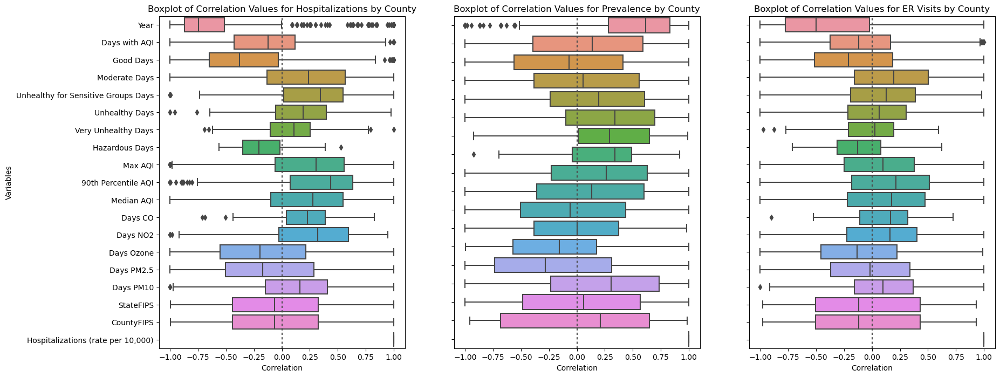

In [77]:
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

sns.boxplot(ax=axs[0], data=hosp_aqi_corr, orient='h')
axs[0].set_title("Boxplot of Correlation Values for Hospitalizations by County")
axs[0].set_xlabel('Correlation')
axs[0].set_ylabel('Variables')
axs[0].axvline(0, color=".3", dashes=(2, 2))


sns.boxplot(ax=axs[1], data=prev_aqi_corr, orient='h')
axs[1].set_title("Boxplot of Correlation Values for Prevalence by County")
axs[1].set_xlabel('Correlation')
axs[1].set_yticklabels([])
axs[1].axvline(0, color=".3", dashes=(2, 2))

sns.boxplot(ax=axs[2], data=er_aqi_corr, orient='h')
axs[2].set_title("Boxplot of Correlation Values for ER Visits by County")
axs[2].set_xlabel('Correlation')
axs[2].set_yticklabels([])
axs[2].axvline(0, color=".3", dashes=(2, 2))

plt.show()


# Discussion

### Asthma Datasets
The distribution of Asthma prevalence values is similar to a normal distribution.  While hospitalizations and ER visits are left skewed.  

The Asthma datasets for ER visits due to asthma and hospitalizations due to asthma run from 2000-2021, while prevalence only spans 2018-2021 as this data came from a relatively new survey project by the CDC.  

The asthma prevalence data spans 25 states, the asthma hospitalization dataset spans 32 states, and the asthma ER visits dataset spans 25 states by 2009.  Because state reporting is not always consistent in these datasets, this could affect prediction models in our project and will have to be kept in mind.  

### Air Quality Datasets
The air quality data was combined with geospatial identifiers in order to track and compare with the asthma datasets.  

In the geospatial maps spanning 2000 to 2019, we observe a notable increase in AQI values, visually depicted by darker shading in the west coast, primarily California and Arizona. Simultaneously, the east coast shows a steady rise in AQI concentrations. Urban population-dense areas also exhibit a slight but consistent increase. These trends highlight dynamic changes and patterns in air quality over the past two decades.

Some variables in the air quality data seem to track with eachother based on the heatmap such as Hazardous days and Max AQI (0.86).  However a notable occurance was that the days of specific pollutants such as CO, NO2, PM2.5, and PM10, had low correlation values.  



### Air Quality and Asthma Correlations

Hospitalizations due to asthma had some moderate correlation values with Days PM2.5 (0.15), median AQI (0.15), 90th Percentile AQI (0.17), and Moderate days (0.17)

Asthma ER visits had some moderate correlation with Days PM2.5 (0.12), Days NO2 (0.15), Days NO2 (0.15), and Moderate days (0.16).

Asthma prevalence had very low correlations to any of the air quality data variables and thus will probably not be a good dataset to base forecasting models on.  
